In [1]:
import numpy as np
import mne
from mne.datasets import sample
import numpy as np

import mne
mne.set_log_level(verbose='CRITICAL')
from mne.datasets import multimodal
from mne import channels, evoked, create_info
import matplotlib.pyplot as plt

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import scipy.signal as sl
from typing import Optional
import scipy as sp
import sys
from nilearn import plotting
sys.path.insert(1, os.path.realpath(os.path.pardir))
from deepmeg.convtools import conviter
from deepmeg.models.interpretable import SPIRIT
from deepmeg.data.datasets import EpochsDataset, read_epochs_dataset
from torch.utils.data import DataLoader
from deepmeg.preprocessing.transforms import zscore
import torch
from collections import defaultdict
import torchmetrics
from deepmeg.training.callbacks import Callback, EarlyStopping, L2Reg, PrintingCallback
from deepmeg.interpreters import SPIRITInterpreter
import random


In [2]:
def generate_activations(
    event_names, roi_labels, n_rois=1
):
    start = 0
    random.shuffle(roi_labels)
    activations = dict()

    for event in event_names:
        n_rois_sel = int(np.random.randint(1, n_rois+1))
        sel_rois = roi_labels[start:start+n_rois_sel]
        activations[event] = [(sel_roi.name, int(np.random.randint(10, 100))) for sel_roi in sel_rois]
        start += n_rois_sel

        if start >= len(roi_labels):
            break

    return activations


def plot_roi(roi_labels, subject, subjects_dir, colors=None, marker_sizes=None):
    coords = list()
    for roi_label in roi_labels:
        if roi_label.name[-2:] == 'lh':
            hemi = 0
        elif roi_label.name[-2:] == 'rh':
            hemi = 1
        else: raise ValueError(f'Hemisphere undefined: {roi_label.name}')

        coords.append(
            mne.vertex_to_mni(
                roi_label.center_of_mass(
                    subject,
                    subjects_dir=subjects_dir
                ),
                hemi,
                subject,
                subjects_dir=subjects_dir
            )
        )
    if isinstance(colors, str):
        colors = [colors for _ in coords]
    view = plotting.view_markers(
        coords, colors,
        marker_size=marker_sizes
    )
    return view


def data_fun(times, latency, duration, rng=None, f = 15):
    """Function to generate source time courses for evoked responses,
    parametrized by latency and duration."""
    if not rng:
        rng = np.random.RandomState(7)
    sigma = 0.375 * duration
    sinusoid = np.sin(2 * np.pi * f * (times - latency))
    gf = np.exp(- (times - latency - (sigma / 4.) * rng.rand(1)) ** 2 /
                (2 * (sigma ** 2)))
    return 1e-9 * sinusoid * gf


# very simple function to plot history of the model training

def plot_metrics(metrics: dict[str, np.ndarray]):
    plot_dict = defaultdict(dict)

    for metric, values in metrics.items():
        metric_data = metric.split('_')
        metric_name = '_'.join(metric_data[:-1])
        metric_kind = metric_data[-1]
        plot_dict[metric_name][metric_kind] = values

    for metric_name, kind_dict in plot_dict.items():
        legend = list()
        for metric_kind, kind in kind_dict.items():
            plt.plot(kind)
            legend.append(metric_kind)
        plt.title(metric_name)
        plt.legend(legend)
        plt.show()

In [3]:
from collections import namedtuple

EventConfig = namedtuple('EventConfig', 'start duration id')


def create_events(*configs: EventConfig, duration, sfreq):
    n_points = int(duration*sfreq)
    all_events = list()
    for config in configs:
        currect_timepoint = int(config.start*sfreq)
        events = list()
        while currect_timepoint < n_points:
            events.append([currect_timepoint, 0, config.id])
            currect_timepoint += int(config.duration*sfreq)
        all_events += events
    all_events = np.array(all_events)
    return all_events[np.argsort(all_events[:, 0])]


In [4]:
data_path = sample.data_path()
subjects_dir = data_path / 'subjects'
subject = 'sample'
meg_path = data_path / 'MEG' / subject
fname_info = meg_path / 'sample_audvis_raw.fif'
info_orig = mne.io.read_info(fname_info)
tstep = 1 / info_orig['sfreq']
fwd_fname = meg_path / 'sample_audvis-meg-eeg-oct-6-fwd.fif'
fwd = mne.read_forward_solution(fwd_fname)
src = fwd['src']
fname_event = meg_path / 'sample_audvis_raw-eve.fif'
fname_cov = meg_path / 'sample_audvis-cov.fif'

events = mne.read_events(fname_event)

# events = create_events(
#     EventConfig(10.6, 1.25, 1),
#     EventConfig(11.2, 1.5, 2),
#     EventConfig(12.0, 1., 3),
#     EventConfig(11.8, 1., 4),
#     EventConfig(11.2, 1.25, 4),
#     EventConfig(10.4, 1.5, 4),
#     duration=200,
#     sfreq=info_orig['sfreq']
# )

noise_cov = mne.read_cov(fname_cov)

event_id = {'e1': 1, 'e2': 2, 'e3': 3,
            'e4': 4, 'e5': 5, 'e6': 32}

all_labels = mne.read_labels_from_annot('sample', parc='aparc.a2009s', subjects_dir=subjects_dir)
label_by_name = {label.name: label for label in all_labels}


In [17]:
activations = generate_activations(
    event_id.keys(),
    all_labels,
    4
)
labels = list()
marker_sizes = list()
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'violet']
all_colors = list()
for color, (event_name, activation) in zip(colors, activations.items()):
    for a in activation:
        labels.append(label_by_name[a[0]])
        marker_sizes.append(a[1])
        all_colors.append(color)

plot_roi(labels, 'sample', subjects_dir, all_colors, marker_sizes)

In [5]:
activations

{'e1': [('G_parietal_sup-rh', 48)],
 'e2': [('G_pariet_inf-Angular-lh', 18), ('S_orbital_med-olfact-rh', 37)],
 'e3': [('G_cuneus-rh', 93), ('S_front_inf-rh', 27)],
 'e4': [('G_and_S_occipital_inf-lh', 25),
  ('G_occipital_middle-lh', 54),
  ('S_oc-temp_med_and_Lingual-lh', 40)],
 'e5': [('S_intrapariet_and_P_trans-rh', 49), ('S_postcentral-rh', 60)],
 'e6': [('G_postcentral-rh', 69)]}

In [ ]:
{
    'e1': [
        ('G_and_S_cingul-Mid-Ant-rh', 41),
        ('S_oc_middle_and_Lunatus-rh', 53),
        ('S_orbital-H_Shaped-rh', 85),
        ('S_intrapariet_and_P_trans-rh', 17)
    ],
    'e2': [
        ('S_temporal_sup-lh', 37),
        ('S_orbital_lateral-lh', 99),
        ('G_front_middle-lh', 57)
    ],
    'e3': [('S_temporal_inf-rh', 78), ('G_orbital-rh', 70)],
    'e4': [('S_pericallosal-rh', 30), ('S_calcarine-rh', 43)],
    'e5': [('G_front_inf-Opercular-rh', 22), ('S_circular_insula_sup-lh', 23)],
    'e6': [('S_circular_insula_sup-rh', 58), ('G_cuneus-lh', 23)]
}

In [137]:
label_by_name.keys()

dict_keys(['G_Ins_lg_and_S_cent_ins-lh', 'G_Ins_lg_and_S_cent_ins-rh', 'G_and_S_cingul-Ant-lh', 'G_and_S_cingul-Ant-rh', 'G_and_S_cingul-Mid-Ant-lh', 'G_and_S_cingul-Mid-Ant-rh', 'G_and_S_cingul-Mid-Post-lh', 'G_and_S_cingul-Mid-Post-rh', 'G_and_S_frontomargin-lh', 'G_and_S_frontomargin-rh', 'G_and_S_occipital_inf-lh', 'G_and_S_occipital_inf-rh', 'G_and_S_paracentral-lh', 'G_and_S_paracentral-rh', 'G_and_S_subcentral-lh', 'G_and_S_subcentral-rh', 'G_and_S_transv_frontopol-lh', 'G_and_S_transv_frontopol-rh', 'G_cingul-Post-dorsal-lh', 'G_cingul-Post-dorsal-rh', 'G_cingul-Post-ventral-lh', 'G_cingul-Post-ventral-rh', 'G_cuneus-lh', 'G_cuneus-rh', 'G_front_inf-Opercular-lh', 'G_front_inf-Opercular-rh', 'G_front_inf-Orbital-lh', 'G_front_inf-Orbital-rh', 'G_front_inf-Triangul-lh', 'G_front_inf-Triangul-rh', 'G_front_middle-lh', 'G_front_middle-rh', 'G_front_sup-lh', 'G_front_sup-rh', 'G_insular_short-lh', 'G_insular_short-rh', 'G_oc-temp_lat-fusifor-lh', 'G_oc-temp_lat-fusifor-rh', 'G_oc-t

In [5]:
activations = {
    'e1': [
        ('S_interm_prim-Jensen-rh', 41),
        ('S_intrapariet_and_P_trans-rh', 17)
        # ('S_oc_middle_and_Lunatus-rh', 53),
    ],
    'e2': [
        ('S_oc-temp_lat-rh', 37),
        ('S_oc-temp_med_and_Lingual-rh', 19),
    ],
    'e3': [
        ('S_circular_insula_inf-rh', 78),
        ('S_collat_transv_post-rh', 28)
        # ('G_orbital-rh', 70)
    ],
    # 'e4': [('S_pericallosal-rh', 30), ('S_calcarine-rh', 43)],
    # 'e5': [('G_front_inf-Opercular-rh', 22), ('S_circular_insula_sup-lh', 23)],
    # 'e6': [('S_circular_insula_sup-rh', 58), ('G_cuneus-lh', 23)]
}

In [62]:
new_activations = generate_activations(
    [
        'e4',
        'e5', 'e6'
    ], all_labels, 8
)

In [6]:
# all_activations = dict(**activations, **new_activations)
all_activations = activations

In [7]:

labels = list()
marker_sizes = list()
colors = ['red', 'orange', 'yellow', 'green', 'blue', 'violet']
all_colors = list()
for color, (event_name, activation) in zip(colors, all_activations.items()):
    for a in activation:
        labels.append(label_by_name[a[0]])
        marker_sizes.append(a[1])
        all_colors.append(color)

plot_roi(labels, 'sample', subjects_dir, all_colors, marker_sizes)

In [8]:
annot = 'aparc.a2009s'
label_names = sorted(set(activation[0]
                         for activation_list in all_activations.values()
                         for activation in activation_list))
region_names = list(all_activations.keys())

In [9]:
times = np.arange(600, dtype=np.float64) / info_orig['sfreq']
rng = np.random.RandomState(7)
source_simulator = mne.simulation.SourceSimulator(src, tstep=tstep)

# durations = [0.05, 0.08, 0.1]
# latencies = [0.1, 0.5, 0.8]
# freqs = [10., 20., 30.]

cfg_data = dict()

for region_id, region_name in enumerate(region_names, 1):
    events_tmp = events[np.where(events[:, 2] == region_id)[0], :]
    for i in range(len(all_activations[region_name])):
        label_name = all_activations[region_name][i][0]
        label_tmp = mne.read_labels_from_annot(subject, annot,
                                               subjects_dir=subjects_dir,
                                               regexp=label_name,
                                               verbose=False)
        label_tmp = label_tmp[0]
        amplitude_tmp = all_activations[region_name][i][1]

        if region_name in activations.keys():
            duration = np.random.uniform(0.01, 0.1)
            # duration = durations[region_id-1]
            latency_tmp = np.random.uniform(0.1, 0.6)
            # latency_tmp = latencies[region_id-1]
            f = np.random.uniform(8., 30.)
        else:
            duration = np.random.uniform(0.01, 0.5)
            latency_tmp = np.random.uniform(0.1, 1.6)
            f = np.random.uniform(8., 30.)
        if region_name not in cfg_data:
            cfg_data[region_name] = dict()
        cfg_data[region_name][label_name] = dict(duration=duration, latency=latency_tmp, frequency=f)
        # f = freqs[region_id-1]
        wf_tmp = data_fun(times, latency_tmp, duration, f=f)
        source_simulator.add_data(label_tmp,
                                  amplitude_tmp * wf_tmp,
                                  events_tmp)

# To obtain a SourceEstimate object, we need to use `get_stc()` method of
# SourceSimulator class.
stc_data = source_simulator.get_stc()

In [10]:
for event, eventdict in cfg_data.items():
    print(f'{event}:')
    for region, regiondict in eventdict.items():
        print(f'\t{region}:')
        for param, value in regiondict.items():
            print(f'\t\t{param}: {value}')

e1:
	S_interm_prim-Jensen-rh:
		duration: 0.09560010599147771
		latency: 0.1306793913168102
		frequency: 14.281000917909665
	S_intrapariet_and_P_trans-rh:
		duration: 0.044121768196206806
		latency: 0.29816145310328
		frequency: 29.863280880183822
e2:
	S_oc-temp_lat-rh:
		duration: 0.026790590713140924
		latency: 0.5785953113205978
		frequency: 28.634507587478886
	S_oc-temp_med_and_Lingual-rh:
		duration: 0.05799741114962928
		latency: 0.379063705303184
		frequency: 19.623870623492973
e3:
	S_circular_insula_inf-rh:
		duration: 0.01957973010969334
		latency: 0.25799166096468584
		frequency: 26.59550543428579
	S_collat_transv_post-rh:
		duration: 0.02593481435217298
		latency: 0.18689337654415647
		frequency: 11.924454041535077


In [12]:
raw_sim = mne.simulation.simulate_raw(info_orig, source_simulator, forward=fwd)
raw_sim.set_eeg_reference(projection=True)

mne.simulation.add_noise(
    raw_sim,
    cov=noise_cov,
    random_state=0
)
# mne.simulation.add_eog(raw_sim, random_state=0)
# mne.simulation.add_ecg(raw_sim, random_state=0)

# Plot original and simulated raw data.
# %matplotlib inline
# fig = raw_sim.plot(title='Simulated raw data')

<RawArray | 376 x 154680 (257.5 s), ~447.0 MB, data loaded>

In [13]:
epochs = mne.Epochs(raw_sim, events, event_id, tmin=-0.2, tmax=2.,
                    baseline=(None, 0), event_repeated='drop')
epochs.load_data().resample(600).crop(0., None).pick_types(meg='grad')
epochsoi = epochs[['e1', 'e2', 'e3']]
evo = epochsoi.average(by_event_type=True)

/home/user/Projects/deepmeg/venv/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


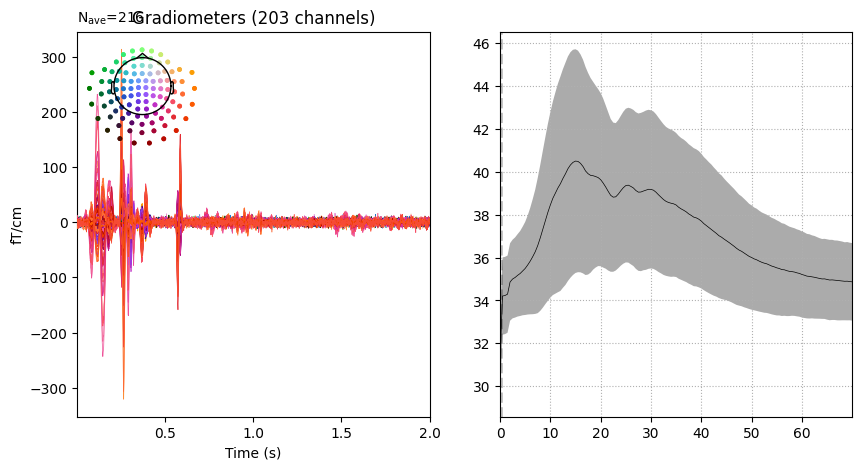

In [14]:
%matplotlib inline
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
epochsoi.plot_psd(average=True, ax=ax2, fmax=70)
epochsoi.average().plot(axes=ax1)
plt.show()

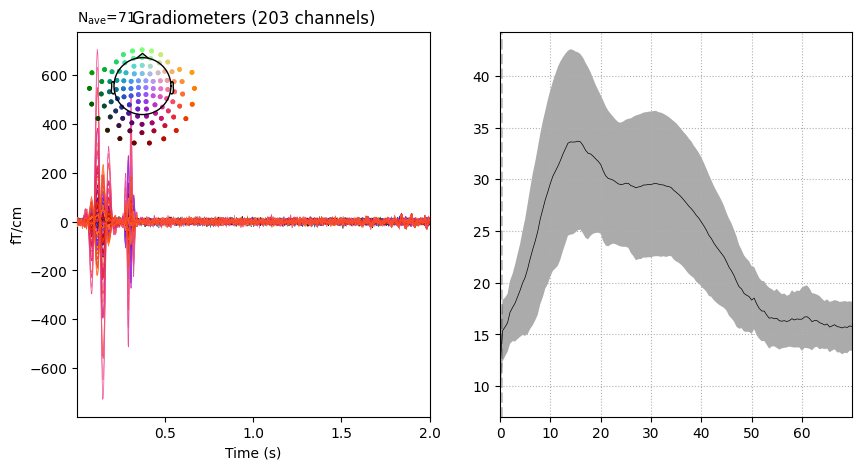

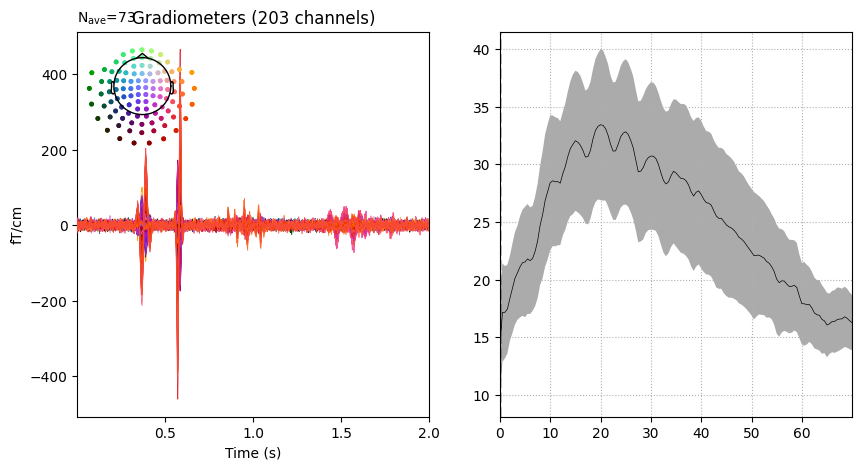

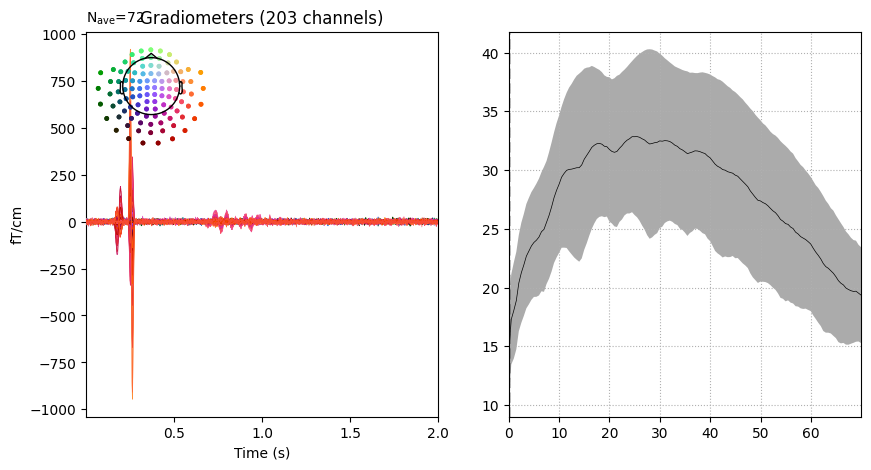

In [15]:
for evoked in evo:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    evoked.plot_psd(average=True, ax=ax2, fmax=70)
    evoked.plot(axes=ax1)
    plt.show()

In [110]:
data = epochsoi.get_data()
labels = epochsoi.events[:, 2]

In [111]:
data.shape

(216, 203, 1201)

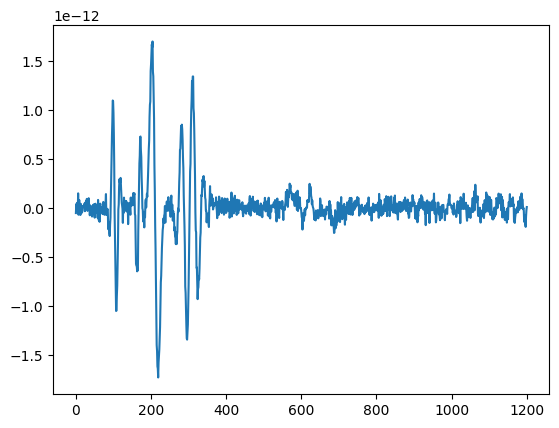

In [115]:
plt.plot(data.mean((0,1)))

In [198]:
data[:, :, 400:] = 2e-10*np.random.random((216, 203, 801)) - 1e-10

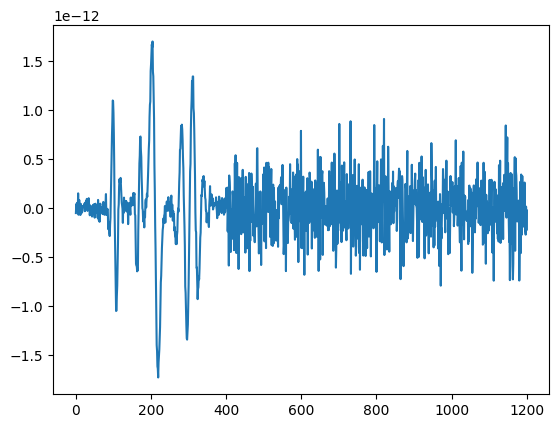

In [199]:
plt.plot(data.mean((0,1)))

In [143]:
from deepmeg.preprocessing.transforms import one_hot_encoder

In [219]:
data.min()

-1.6566554854793788e-10

In [16]:
dataset = EpochsDataset(
    (
        epochsoi
        # data,
        # one_hot_encoder(labels)
    ),
    savepath='../simulated_n',
    transform=zscore
)

In [17]:
dataset.save('../dataset/simulated_n.pt')

In [18]:
dataset = read_epochs_dataset('../dataset/simulated_n.pt')

In [19]:
train, test = torch.utils.data.random_split(dataset, [.7, .3])

In [20]:
kwargs = dict(
    n_channels=203,
    n_latent=8,
    # n_times=601,
    n_times=1201,
    filter_size=50,
    window_size=10,
    latent_dim=10,
    pool_factor=10,
    n_outputs=3
)

In [21]:
model = SPIRIT(
    **kwargs
)

In [22]:
X, y = next(iter(DataLoader(test)))
X.shape

torch.Size([1, 203, 1201])

In [23]:

model(X)

/home/user/Projects/deepmeg/venv/lib/python3.10/site-packages/torch/nn/modules/conv.py:309: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at ../aten/src/ATen/native/Convolution.cpp:895.)
  return F.conv1d(input, weight, bias, self.stride,


tensor([[-0.0951, -0.4347, -0.1899]], grad_fn=<AddmmBackward0>)

In [ ]:
# from mne.datasets import multimodal
# fname_raw = os.path.join(multimodal.data_path(), 'multimodal_raw.fif')
data_path = sample.data_path()
subjects_dir = data_path / 'subjects'
subject = 'sample'
meg_path = data_path / 'MEG' / subject
fname_raw = meg_path / 'sample_audvis_raw.fif'

info = mne.io.read_raw_fif(fname_raw).resample(600).pick_types(meg='grad').info

In [24]:
from deepmeg.models.interpretable import LFCNN

model = LFCNN(
    n_channels=203, # ~ number of channels (gradiometers)
    n_latent=8, # ~ number of latent factors
    # n_times=601, # ~ number of samples in epoch after preprocessing
    n_times=1201,
    filter_size=50, # ~ FIR filter size
    pool_factor=10, # ~ take each 10th sample from spatially filtered components
    n_outputs=3 # ~ number of output classes (number of events in epochs)
)

optimizer = torch.optim.Adam
loss = torch.nn.BCEWithLogitsLoss()
metric = torchmetrics.functional.classification.binary_accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(), # print ongoing training history
        EarlyStopping(patience=15, monitor='loss_val', restore_best_weights=True), # perform early stopping with restoring best weights
        L2Reg(
            [
                'unmixing_layer.weight', 'temp_conv.weight',
            ], lambdas=.01
        ) # l2 regularization for weights of spatial- and temporal filtering layers
    ]
)

Epoch 0:  loss_train:  0.7654   |    binary_accuracy_train:  0.3419   |    loss_val:  0.7530   |    binary_accuracy_val:  0.4095
Epoch 1:  loss_train:  0.7320   |    binary_accuracy_train:  0.4615   |    loss_val:  0.7310   |    binary_accuracy_val:  0.5429
Epoch 2:  loss_train:  0.7012   |    binary_accuracy_train:  0.6068   |    loss_val:  0.7106   |    binary_accuracy_val:  0.6000
Epoch 3:  loss_train:  0.6718   |    binary_accuracy_train:  0.7350   |    loss_val:  0.6907   |    binary_accuracy_val:  0.6762
Epoch 4:  loss_train:  0.6426   |    binary_accuracy_train:  0.7977   |    loss_val:  0.6703   |    binary_accuracy_val:  0.6952
Epoch 5:  loss_train:  0.6130   |    binary_accuracy_train:  0.8803   |    loss_val:  0.6490   |    binary_accuracy_val:  0.7429
Epoch 6:  loss_train:  0.5822   |    binary_accuracy_train:  0.9031   |    loss_val:  0.6264   |    binary_accuracy_val:  0.7714
Epoch 7:  loss_train:  0.5500   |    binary_accuracy_train:  0.9430   |    loss_val:  0.6021   | 

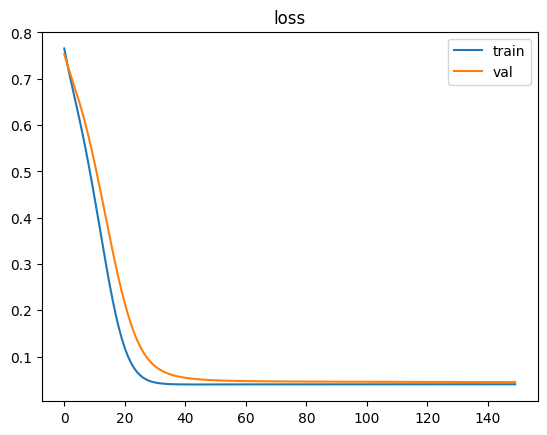

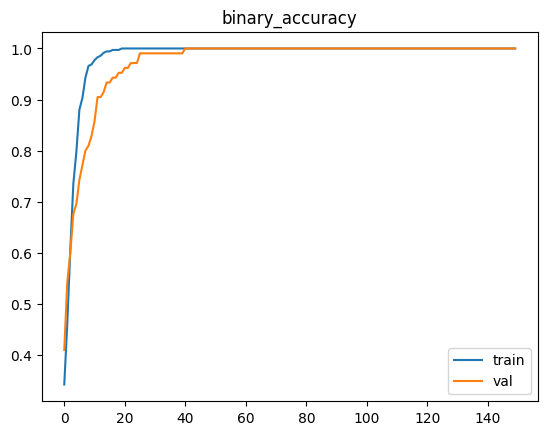

In [25]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [27]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.04134821146726608
train_binary_accuracy: 1.0
loss: 0.041405761445110496
binary_accuracy: 1.0


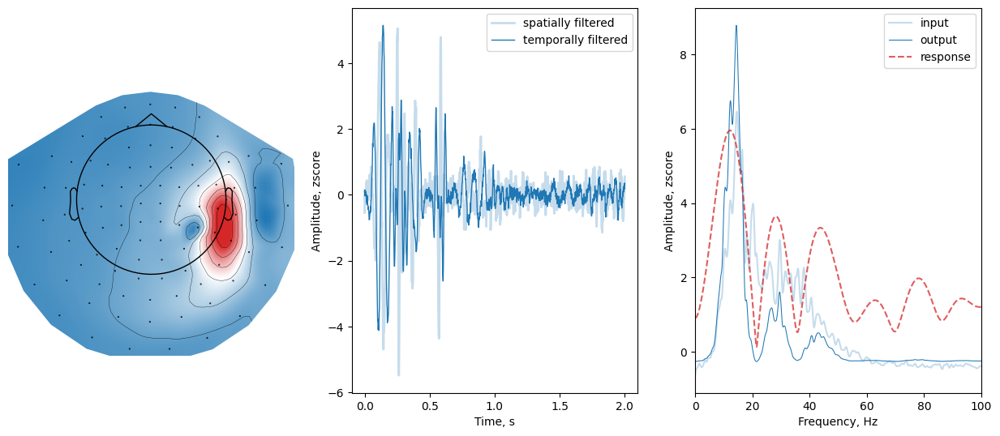

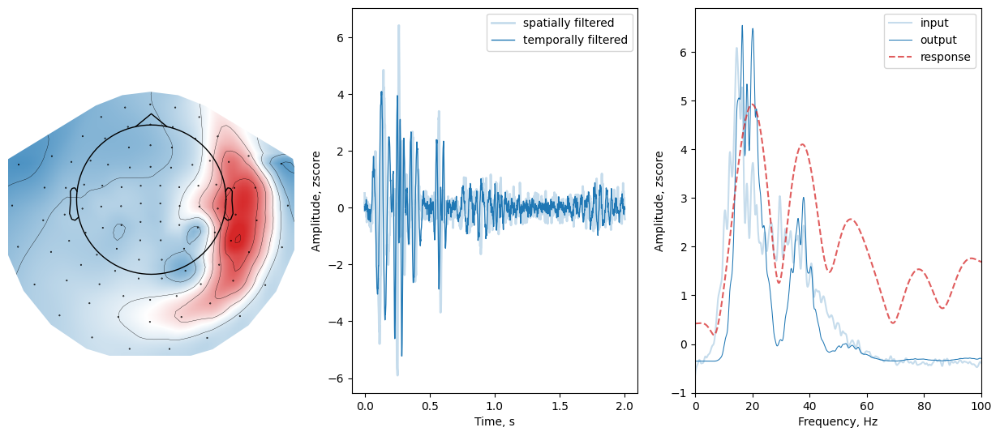

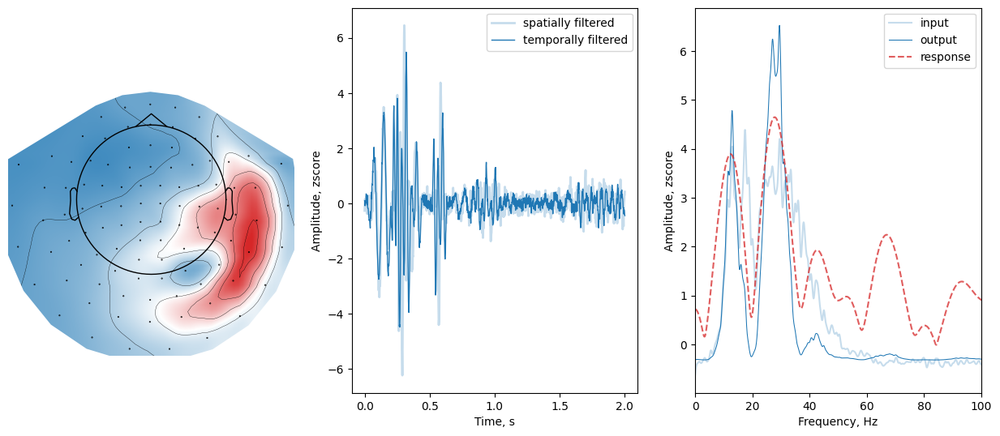

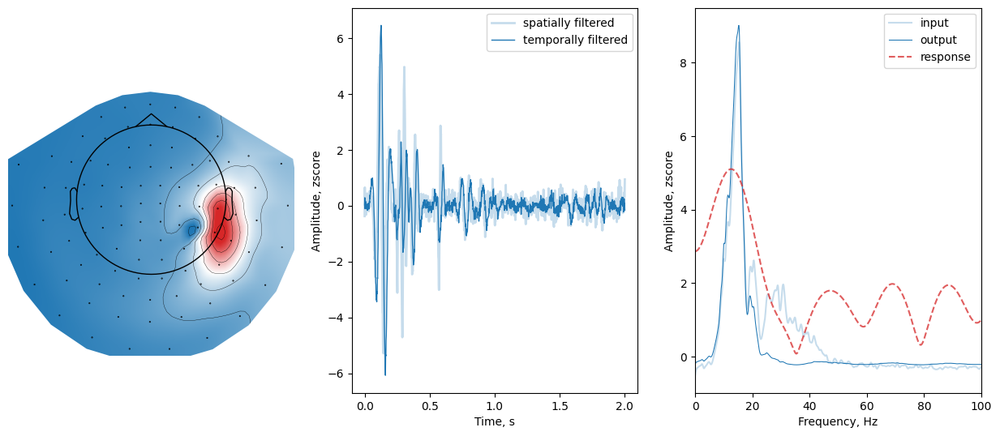

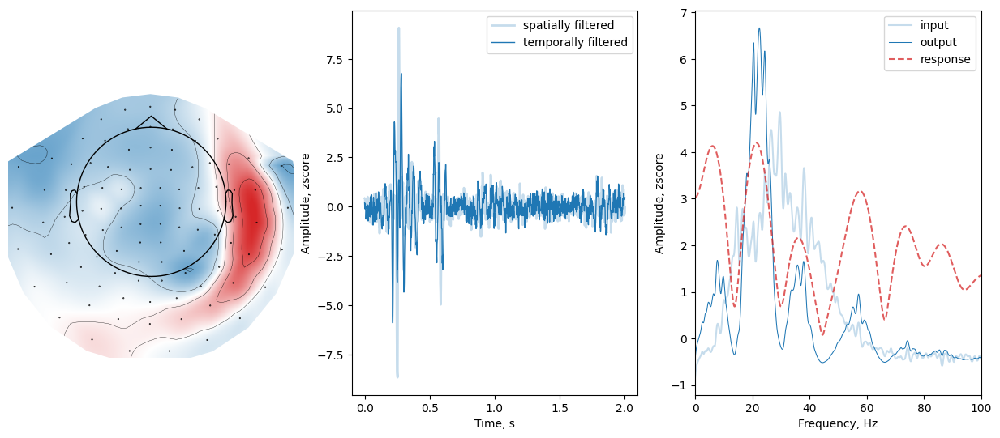

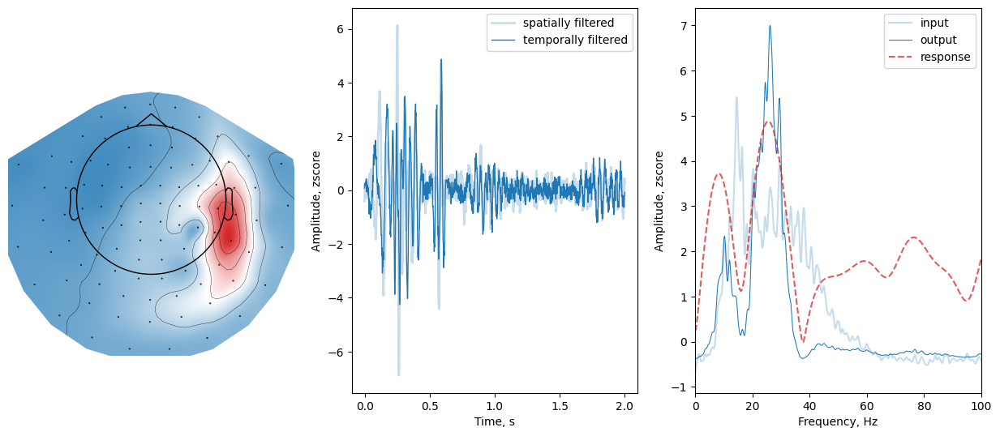

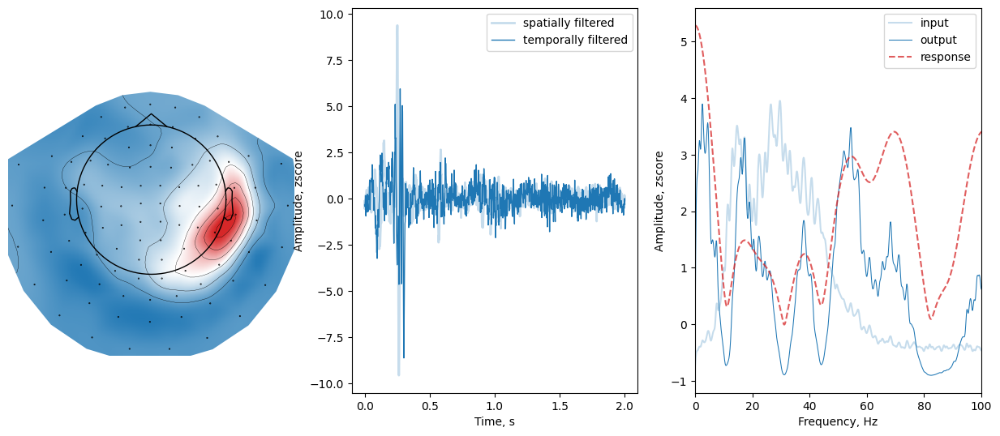

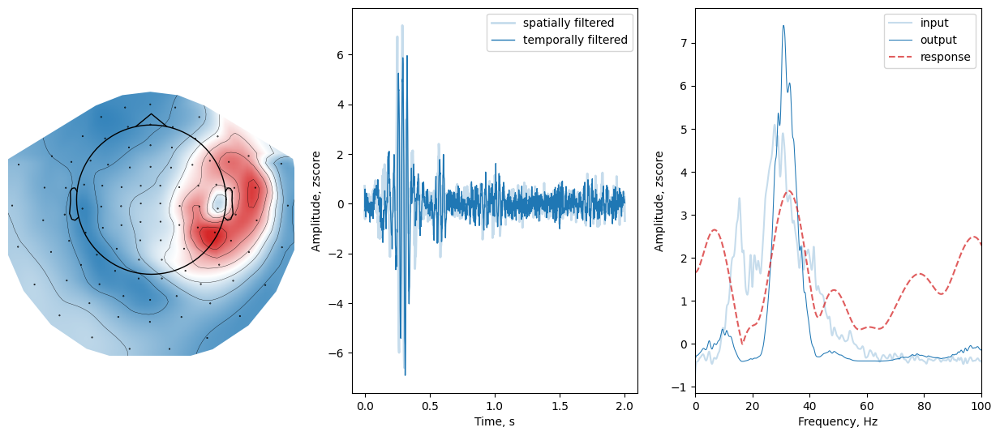

In [28]:
from deepmeg.interpreters import LFCNNInterpreter

interpreter = LFCNNInterpreter(model, test, info)
for branch in range(8):
    fig = interpreter.plot_branch(branch)
    plt.show()

In [29]:
from deepmeg.models.interpretable import TimeCompNet

model = TimeCompNet(
    n_channels=203, # ~ number of channels (gradiometers)
    n_latent=8, # ~ number of latent factors
    n_times=1201, # ~ number of samples in epoch after preprocessing
    filter_size=50, # ~ FIR filter size
    pool_factor=10, # ~ take each 10th sample from spatially filtered components
    n_outputs=3 # ~ number of output classes (number of events in epochs)
)

optimizer = torch.optim.Adam
loss = torch.nn.BCEWithLogitsLoss()
metric = torchmetrics.functional.classification.binary_accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(), # print ongoing training history
        EarlyStopping(patience=15, monitor='loss_val', restore_best_weights=True), # perform early stopping with restoring best weights
        L2Reg(
            [
                'unmixing_layer.weight', 'temp_conv.weight',
                *[f'timesel_list.{i}.0.weight' for i in range(8)],
            ], lambdas=[.01, .01, *[1e-3 for _ in range(8)]]
        ) # l2 regularization for weights of spatial- and temporal filtering layers
    ]
)

Epoch 0:  loss_train:  0.7987   |    binary_accuracy_train:  0.4160   |    loss_val:  0.6937   |    binary_accuracy_val:  0.6667
Epoch 1:  loss_train:  0.6746   |    binary_accuracy_train:  0.6667   |    loss_val:  0.6700   |    binary_accuracy_val:  0.6667
Epoch 2:  loss_train:  0.6316   |    binary_accuracy_train:  0.6667   |    loss_val:  0.6492   |    binary_accuracy_val:  0.6667
Epoch 3:  loss_train:  0.5894   |    binary_accuracy_train:  0.6667   |    loss_val:  0.6023   |    binary_accuracy_val:  0.6667
Epoch 4:  loss_train:  0.5214   |    binary_accuracy_train:  0.6667   |    loss_val:  0.5400   |    binary_accuracy_val:  0.6857
Epoch 5:  loss_train:  0.4422   |    binary_accuracy_train:  0.8120   |    loss_val:  0.4778   |    binary_accuracy_val:  0.8762
Epoch 6:  loss_train:  0.3702   |    binary_accuracy_train:  0.9772   |    loss_val:  0.4241   |    binary_accuracy_val:  0.9333
Epoch 7:  loss_train:  0.3142   |    binary_accuracy_train:  0.9972   |    loss_val:  0.3784   | 

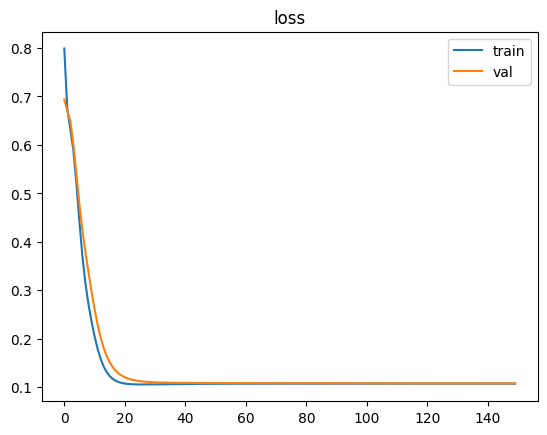

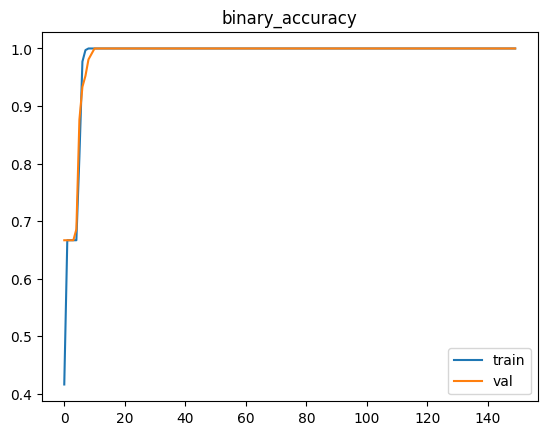

In [30]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [31]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.1076902679421685
train_binary_accuracy: 1.0
loss: 0.10804869776422327
binary_accuracy: 1.0


Estimating temporal compression weights, it will take some time
9it [17:47, 133.49s/it]                       


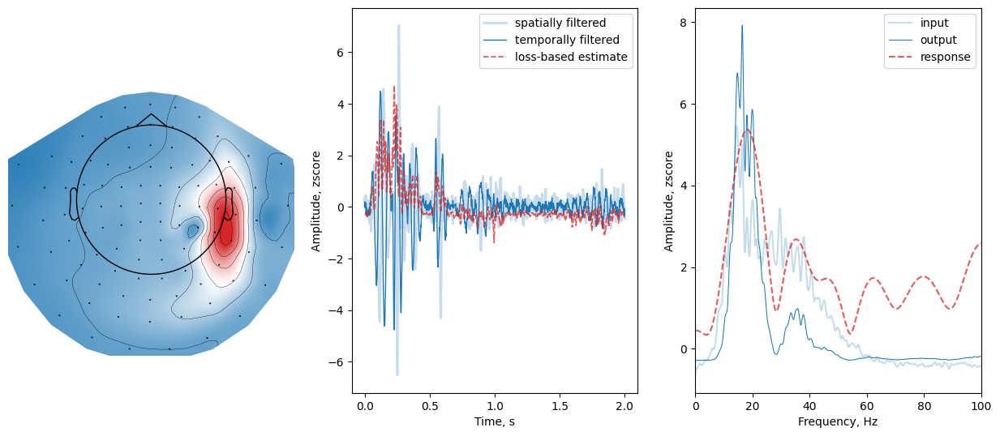

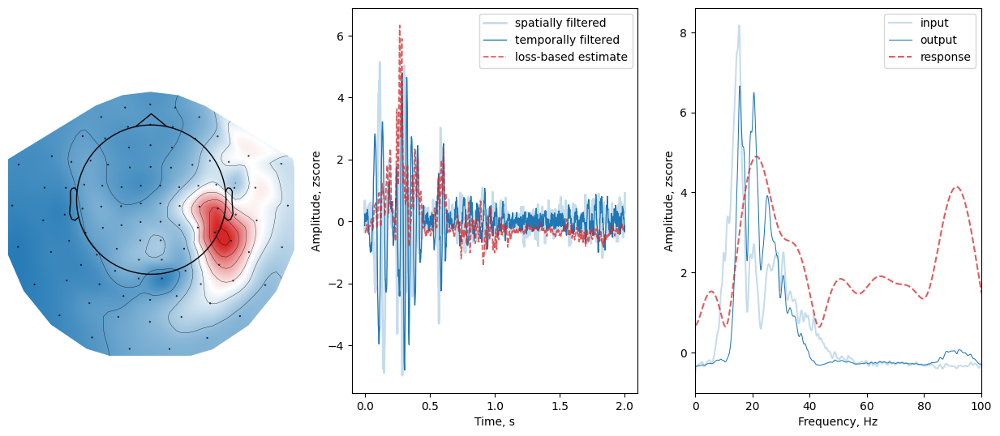

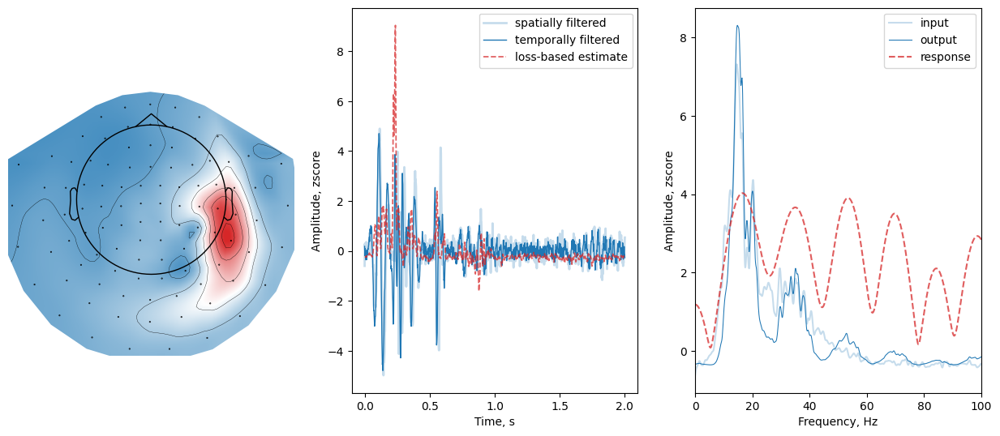

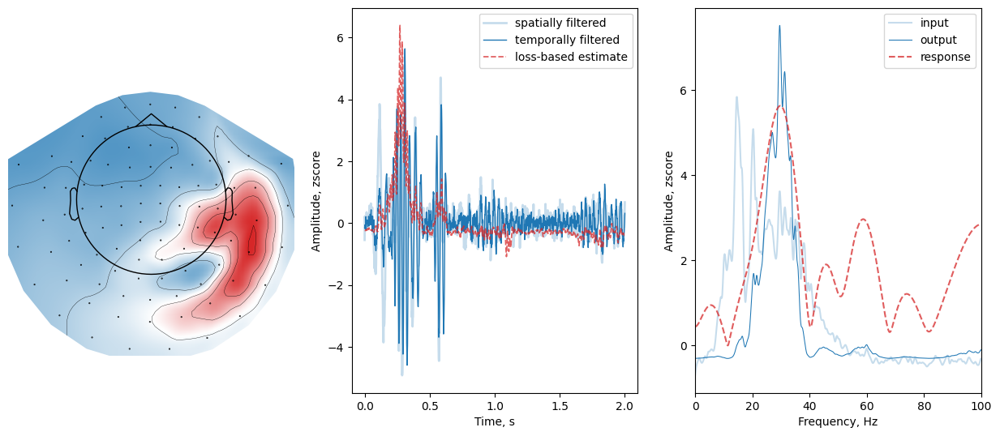

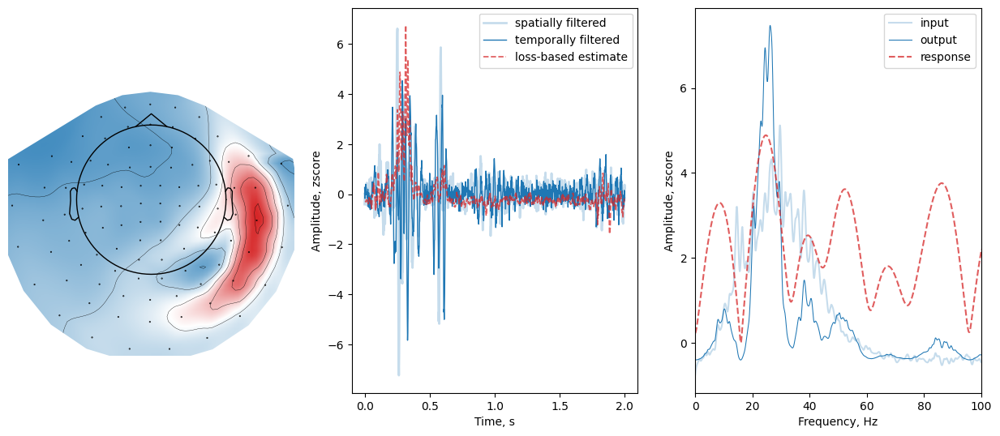

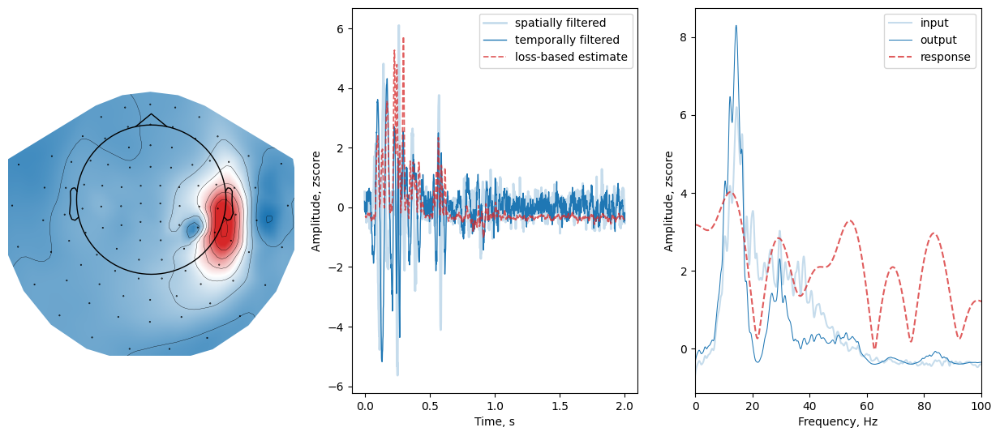

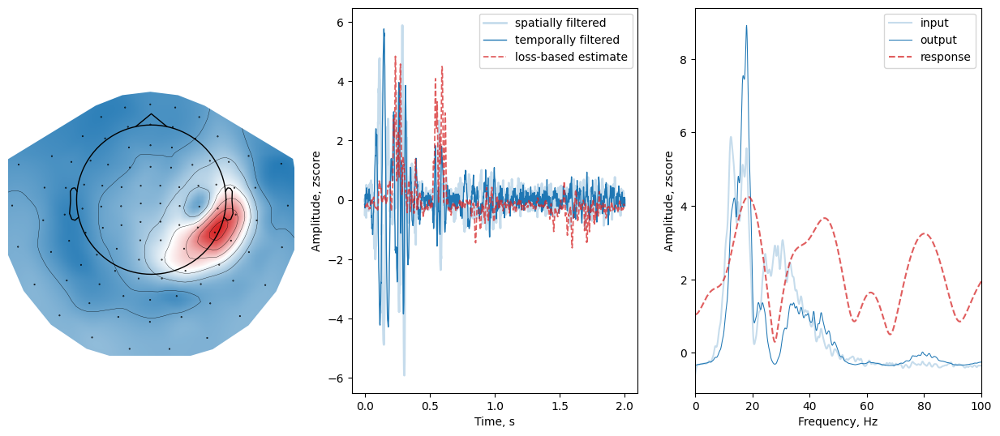

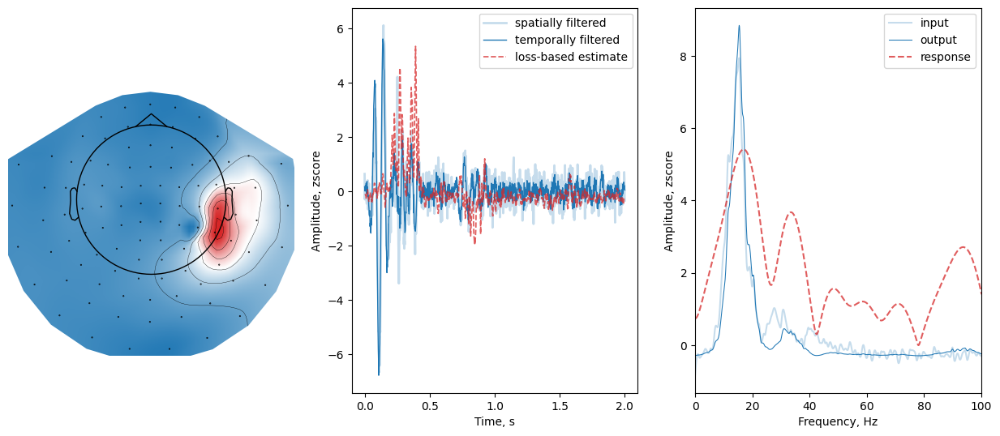

In [32]:
from deepmeg.interpreters import TimeCompNetInterpreter

interpreter = TimeCompNetInterpreter(model, test, info)
for branch in range(8):
    fig = interpreter.plot_branch(branch)
    plt.show()

In [33]:
model = SPIRIT(
    **kwargs
)

optimizer = torch.optim.Adam
loss = torch.nn.BCEWithLogitsLoss()
metric = torchmetrics.functional.classification.binary_accuracy

model.compile(
    optimizer,
    loss,
    metric,
    callbacks=[
        PrintingCallback(), # print ongoing training history
        EarlyStopping(patience=15, monitor='loss_val', restore_best_weights=True), # perform early stopping with restoring best weights
        L2Reg(
            [
                'unmixing_layer.weight', 'temp_conv.weight',
                *[f'timesel_list.{i}.0.weight' for i in range(8)],
                *[f'timecomp_list.{i}.0.weight' for i in range(8)],
            ], lambdas=[
                .01, .01,
                *[.001 for _ in range(8)],
                *[.001 for _ in range(8)]
            ]
            # lambdas=.01
        ) # l2 regularization for weights of spatial- and temporal filtering layers
    ]
)

Epoch 0:  loss_train:  0.8269   |    binary_accuracy_train:  0.6667   |    loss_val:  0.7375   |    binary_accuracy_val:  0.6667
Epoch 1:  loss_train:  0.7413   |    binary_accuracy_train:  0.6667   |    loss_val:  0.7165   |    binary_accuracy_val:  0.6667
Epoch 2:  loss_train:  0.7135   |    binary_accuracy_train:  0.6667   |    loss_val:  0.7251   |    binary_accuracy_val:  0.6667
Epoch 3:  loss_train:  0.7079   |    binary_accuracy_train:  0.6667   |    loss_val:  0.7319   |    binary_accuracy_val:  0.6667
Epoch 4:  loss_train:  0.6979   |    binary_accuracy_train:  0.6667   |    loss_val:  0.7242   |    binary_accuracy_val:  0.6667
Epoch 5:  loss_train:  0.6739   |    binary_accuracy_train:  0.6667   |    loss_val:  0.7013   |    binary_accuracy_val:  0.6667
Epoch 6:  loss_train:  0.6390   |    binary_accuracy_train:  0.6667   |    loss_val:  0.6653   |    binary_accuracy_val:  0.7619
Epoch 7:  loss_train:  0.5966   |    binary_accuracy_train:  0.7949   |    loss_val:  0.6175   | 

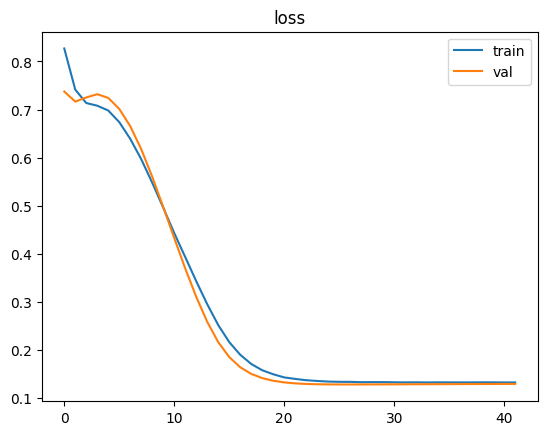

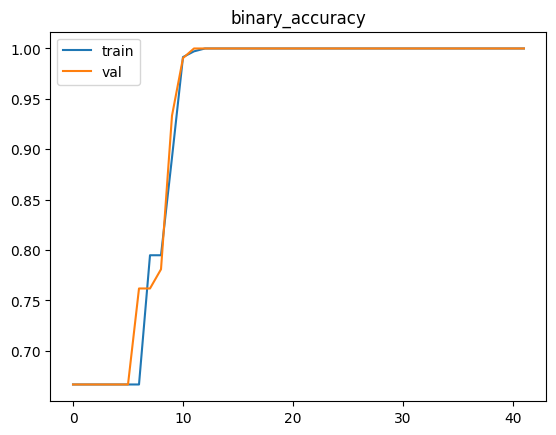

In [34]:
history = model.fit(train, n_epochs=150, batch_size=200, val_batch_size=60)
plot_metrics(history)

In [35]:
train_result = model.evaluate(train)
result = model.evaluate(test)

for measure, value in train_result.items():
    print(f'train_{measure}: {value}')

for measure, value in result.items():
    print(f'{measure}: {value}')

train_loss: 0.12478702718561346
train_binary_accuracy: 1.0
loss: 0.12532048604705118
binary_accuracy: 1.0


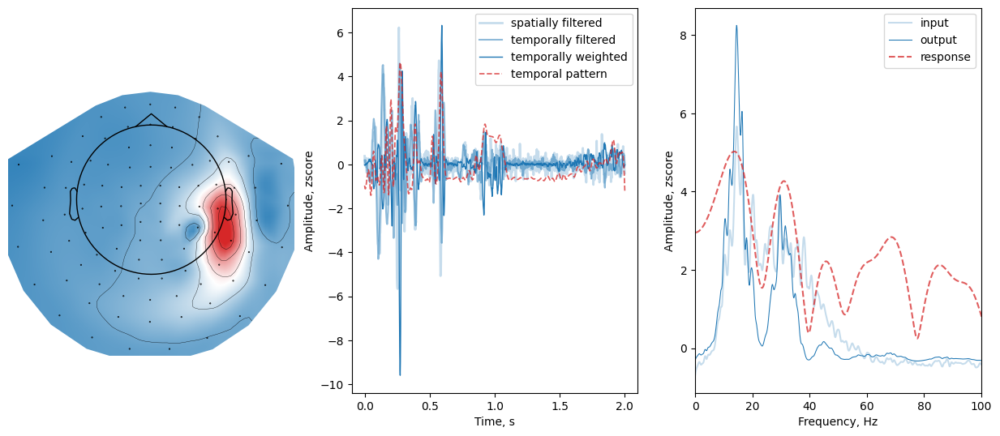

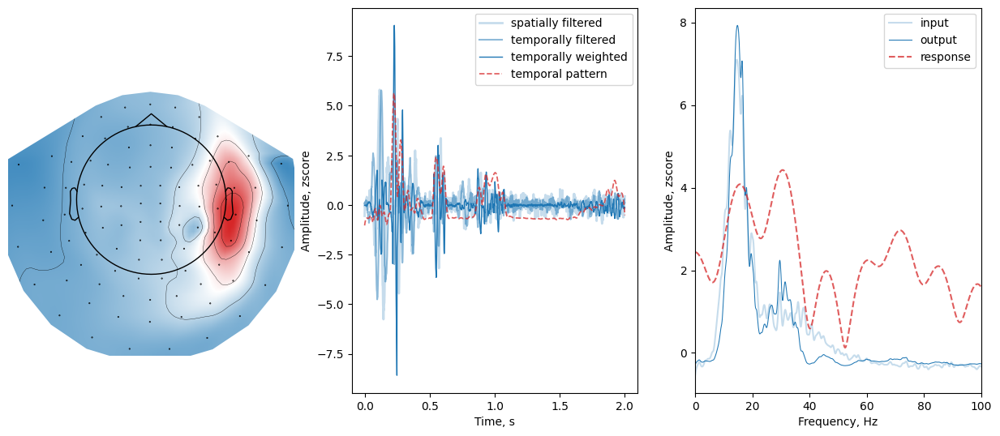

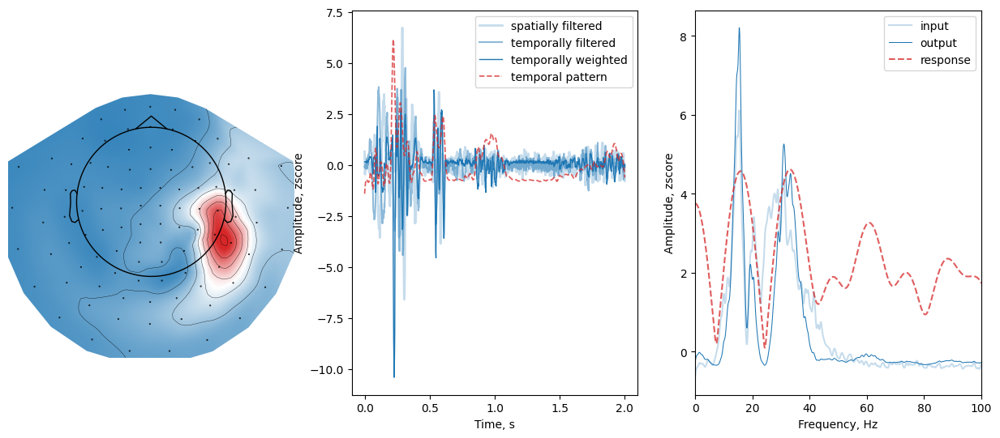

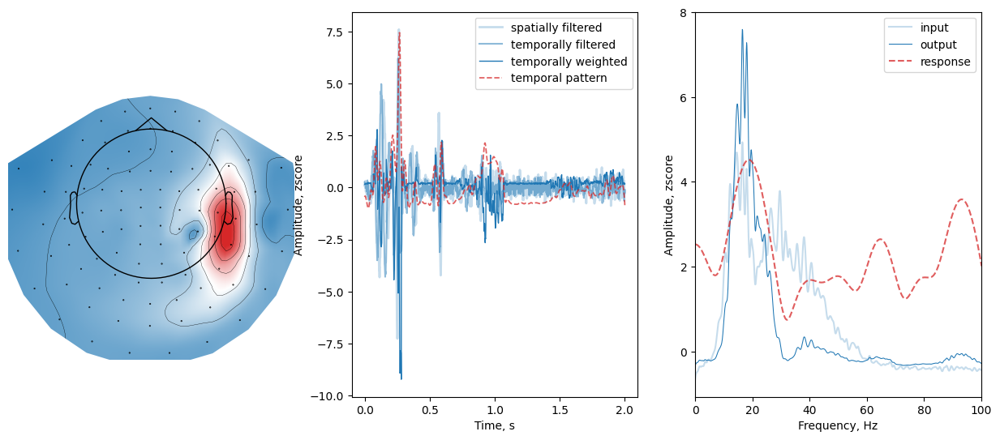

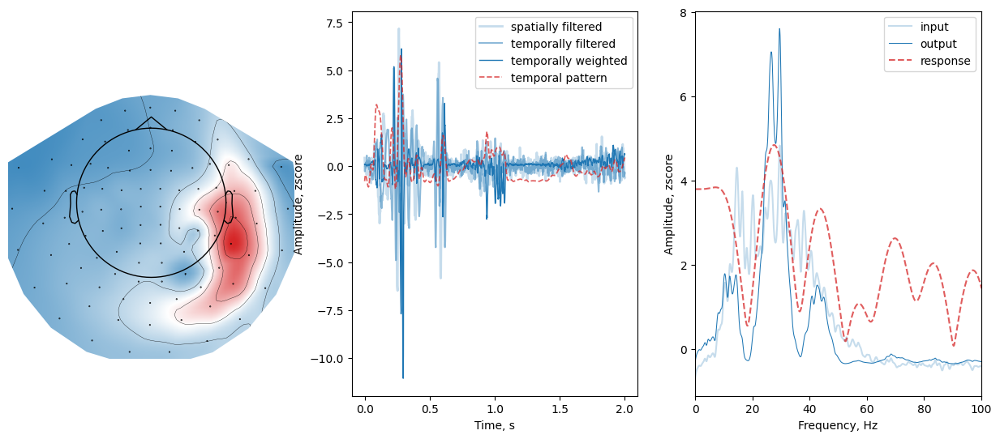

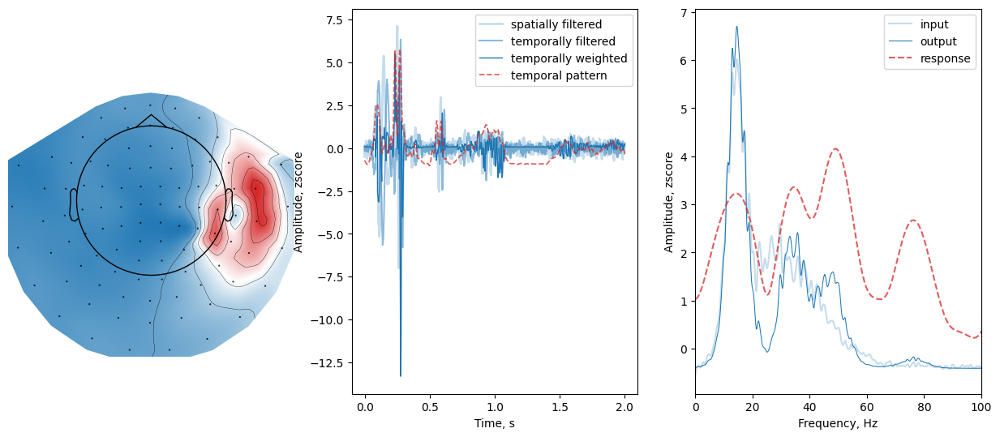

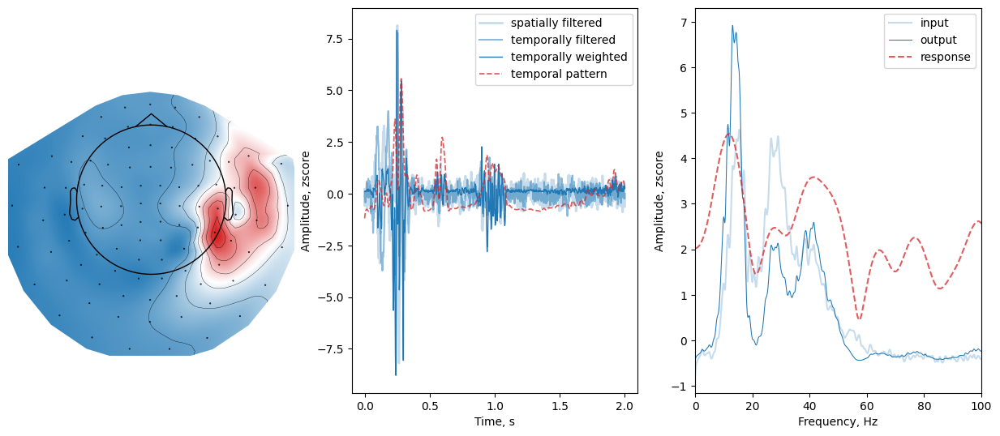

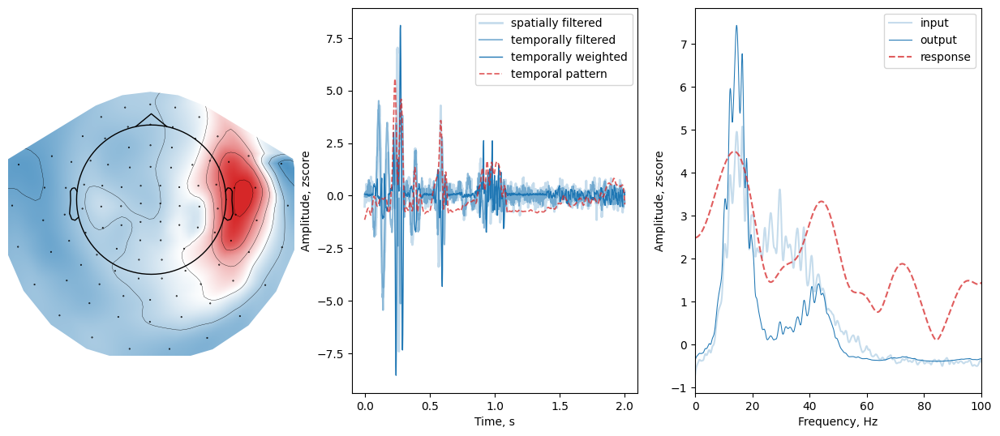

In [36]:
interpreter = SPIRITInterpreter(model, test, info)
for branch in range(8):
    fig = interpreter.plot_branch(branch)
    plt.show()